In [1]:
pip install seaborn

  Using cached pandas-2.2.3-cp313-cp313-macosx_11_0_arm64.whl.metadata (89 kB)
  Using cached pillow-11.0.0-cp313-cp313-macosx_11_0_arm64.whl.metadata (9.1 kB)
  Using cached pytz-2024.2-py2.py3-none-any.whl.metadata (22 kB)
  Using cached tzdata-2024.2-py2.py3-none-any.whl.metadata (1.4 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 8.6 MB/s eta 0:00:00a 0:00:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 3.8 MB/s eta 0:00:00a 0:00:01
Using cached pandas-2.2.3-cp313-cp313-macosx_11_0_arm64.whl (11.3 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 3.7 MB/s eta 0:00:00a 0:00:01
Using cached pillow-11.0.0-cp313-cp313-macosx_11_0_arm64.whl (3.0 MB)
Using cached pytz-2024.2-py2.py3-none-any.whl (508 kB)
Using cached tzdata-2024.2-py2.py3-none-any.whl (346 kB)

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip3.13 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


Matplotlib is building the font cache; this may take a moment.



#read all csv files for analysis , cleaning and deriving insights and patterns

In [3]:
customer = pd.read_csv("Customers.csv", encoding='latin1') #since this format of csv is not in default utf-8 .. we have given it as encoding = ISO-8859-1 
exchange = pd.read_csv("Exchange_Rates.csv")
products = pd.read_csv("Products.csv")
sales = pd.read_csv("Sales.csv")
Stores = pd.read_csv("Stores.csv")

Analysis of Customer data

In [4]:
customer

,CustomerKey,Gender,Name,City,State Code,State,Zip Code,Country,Continent,Birthday
0,301,Female,Lilly Harding,WANDEARAH EAST,SA,South Australia,5523,Australia,Australia,7/3/1939
1,325,Female,Madison Hull,MOUNT BUDD,WA,Western Australia,6522,Australia,Australia,9/27/1979
2,554,Female,Claire Ferres,WINJALLOK,VIC,Victoria,3380,Australia,Australia,5/26/1947
3,786,Male,Jai Poltpalingada,MIDDLE RIVER,SA,South Australia,5223,Australia,Australia,9/17/1957
4,1042,Male,Aidan Pankhurst,TAWONGA SOUTH,VIC,Victoria,3698,Australia,Australia,11/19/1965
...,...,...,...,...,...,...,...,...,...,...
15261,2099600,Female,Denisa Duková,Houston,TX,Texas,77017,United States,North America,3/25/1936
15262,2099618,Male,Justin Solórzano,Mclean,VA,Virginia,22101,United States,North America,2/16/1992
15263,2099758,Male,Svend Petrussen,Wilmington,NC,North Carolina,28405,United States,North America,11/9/1937
15264,2099862,Female,Lorenza Rush,Riverside,CA,California,92501,United States,North America,10/12/1937


In [5]:
customer.head()

,CustomerKey,Gender,Name,City,State Code,State,Zip Code,Country,Continent,Birthday
0,301,Female,Lilly Harding,WANDEARAH EAST,SA,South Australia,5523,Australia,Australia,7/3/1939
1,325,Female,Madison Hull,MOUNT BUDD,WA,Western Australia,6522,Australia,Australia,9/27/1979
2,554,Female,Claire Ferres,WINJALLOK,VIC,Victoria,3380,Australia,Australia,5/26/1947
3,786,Male,Jai Poltpalingada,MIDDLE RIVER,SA,South Australia,5223,Australia,Australia,9/17/1957
4,1042,Male,Aidan Pankhurst,TAWONGA SOUTH,VIC,Victoria,3698,Australia,Australia,11/19/1965


In [6]:
customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15266 entries, 0 to 15265
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   CustomerKey  15266 non-null  int64 
 1   Gender       15266 non-null  object
 2   Name         15266 non-null  object
 3   City         15266 non-null  object
 4   State Code   15256 non-null  object
 5   State        15266 non-null  object
 6   Zip Code     15266 non-null  object
 7   Country      15266 non-null  object
 8   Continent    15266 non-null  object
 9   Birthday     15266 non-null  object
dtypes: int64(1), object(9)
memory usage: 1.2+ MB


In [7]:
customer.isna().sum()

CustomerKey     0
Gender          0
Name            0
City            0
State Code     10
State           0
Zip Code        0
Country         0
Continent       0
Birthday        0
dtype: int64

In [8]:
if not customer[customer['State Code'].isnull()].empty:   #printing the null values
    print(customer[customer['State Code'].isnull()][['State Code','State']])

     State Code   State
5304        NaN  Napoli
5316        NaN  Napoli
5372        NaN  Napoli
5377        NaN  Napoli
5378        NaN  Napoli
5485        NaN  Napoli
5525        NaN  Napoli
5531        NaN  Napoli
5631        NaN  Napoli
5695        NaN  Napoli


In [156]:
# # Update 'State Code' to 'NA' where 'State Name' is 'Napoli' and 'State Code' is NaN
# customer.loc[(customer['State Code'] == 'Napoli') & (customer['State Code'].isna()), 'State Code'] = 'Not Available'


In [9]:
customer[customer['State']=="Napoli"]

,CustomerKey,Gender,Name,City,State Code,State,Zip Code,Country,Continent,Birthday
5304,729681,Female,Rossana Padovesi,Polvica,NaN,Napoli,80035,Italy,Europe,4/18/1981
5316,732289,Male,Indro Piccio,Varcaturo,NaN,Napoli,80014,Italy,Europe,2/24/1949
5372,742042,Male,Amaranto Loggia,Casaferro,NaN,Napoli,80034,Italy,Europe,3/14/1936
5377,742886,Female,Edmonda Capon,Terzigno,NaN,Napoli,80040,Italy,Europe,8/6/1963
5378,743343,Female,Ambra Sagese,Pomigliano D'Arco,NaN,Napoli,80038,Italy,Europe,1/5/1961
5485,759705,Male,Callisto Lo Duca,Casilli,NaN,Napoli,80047,Italy,Europe,8/28/1976
5525,765589,Male,Michelino Lucchesi,Pompei Scavi,NaN,Napoli,80045,Italy,Europe,11/13/1947
5531,766410,Male,Adelmio Beneventi,Licola,NaN,Napoli,80078,Italy,Europe,1/13/1940
5631,781667,Female,Ilda Manna,Napoli,NaN,Napoli,80134,Italy,Europe,5/8/1977
5695,789177,Male,Calogero Folliero,Mariglianella,NaN,Napoli,80030,Italy,Europe,3/3/2000


In [10]:
customer['State Code']=customer['State Code'].fillna("Not Available")

In [11]:
customer[customer['State']=="Napoli"]

,CustomerKey,Gender,Name,City,State Code,State,Zip Code,Country,Continent,Birthday
5304,729681,Female,Rossana Padovesi,Polvica,Not Available,Napoli,80035,Italy,Europe,4/18/1981
5316,732289,Male,Indro Piccio,Varcaturo,Not Available,Napoli,80014,Italy,Europe,2/24/1949
5372,742042,Male,Amaranto Loggia,Casaferro,Not Available,Napoli,80034,Italy,Europe,3/14/1936
5377,742886,Female,Edmonda Capon,Terzigno,Not Available,Napoli,80040,Italy,Europe,8/6/1963
5378,743343,Female,Ambra Sagese,Pomigliano D'Arco,Not Available,Napoli,80038,Italy,Europe,1/5/1961
5485,759705,Male,Callisto Lo Duca,Casilli,Not Available,Napoli,80047,Italy,Europe,8/28/1976
5525,765589,Male,Michelino Lucchesi,Pompei Scavi,Not Available,Napoli,80045,Italy,Europe,11/13/1947
5531,766410,Male,Adelmio Beneventi,Licola,Not Available,Napoli,80078,Italy,Europe,1/13/1940
5631,781667,Female,Ilda Manna,Napoli,Not Available,Napoli,80134,Italy,Europe,5/8/1977
5695,789177,Male,Calogero Folliero,Mariglianella,Not Available,Napoli,80030,Italy,Europe,3/3/2000


In [12]:
customer.duplicated().sum()

np.int64(0)

In [13]:
customer.isna().sum()

CustomerKey    0
Gender         0
Name           0
City           0
State Code     0
State          0
Zip Code       0
Country        0
Continent      0
Birthday       0
dtype: int64

In [14]:
customer["Birthday"] =  pd.to_datetime(customer['Birthday'],  format='%m/%d/%Y') #change datatype of order date to datetime from object


In [15]:
customer["Birthday"].head() 

0   1939-07-03
1   1979-09-27
2   1947-05-26
3   1957-09-17
4   1965-11-19
Name: Birthday, dtype: datetime64[ns]

In [16]:
customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15266 entries, 0 to 15265
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   CustomerKey  15266 non-null  int64         
 1   Gender       15266 non-null  object        
 2   Name         15266 non-null  object        
 3   City         15266 non-null  object        
 4   State Code   15266 non-null  object        
 5   State        15266 non-null  object        
 6   Zip Code     15266 non-null  object        
 7   Country      15266 non-null  object        
 8   Continent    15266 non-null  object        
 9   Birthday     15266 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int64(1), object(8)
memory usage: 1.2+ MB


In [17]:
customer.duplicated().sum() #check if there is any duplicate after filling missing values

np.int64(0)

In [18]:
customer.shape

(15266, 10)

In [19]:
customer.dropna(subset=['CustomerKey', 'Gender'], inplace=True) #removing null values from customerkey and gender


In [20]:
customer.shape


(15266, 10)

In [21]:
customer.isnull().sum()

CustomerKey    0
Gender         0
Name           0
City           0
State Code     0
State          0
Zip Code       0
Country        0
Continent      0
Birthday       0
dtype: int64

In [170]:
customer.to_csv("new datasets/customer.csv", index=False)

Sales Analysis

In [22]:
sales

,Order Number,Line Item,Order Date,Delivery Date,CustomerKey,StoreKey,ProductKey,Quantity,Currency Code
0,366000,1,1/1/2016,NaN,265598,10,1304,1,CAD
1,366001,1,1/1/2016,1/13/2016,1269051,0,1048,2,USD
2,366001,2,1/1/2016,1/13/2016,1269051,0,2007,1,USD
3,366002,1,1/1/2016,1/12/2016,266019,0,1106,7,CAD
4,366002,2,1/1/2016,1/12/2016,266019,0,373,1,CAD
...,...,...,...,...,...,...,...,...,...
62879,2243030,1,2/20/2021,NaN,1216913,43,632,3,USD
62880,2243031,1,2/20/2021,2/24/2021,511229,0,98,4,EUR
62881,2243032,1,2/20/2021,2/23/2021,331277,0,1613,2,CAD
62882,2243032,2,2/20/2021,2/23/2021,331277,0,1717,2,CAD


In [23]:
sales.head()

,Order Number,Line Item,Order Date,Delivery Date,CustomerKey,StoreKey,ProductKey,Quantity,Currency Code
0,366000,1,1/1/2016,NaN,265598,10,1304,1,CAD
1,366001,1,1/1/2016,1/13/2016,1269051,0,1048,2,USD
2,366001,2,1/1/2016,1/13/2016,1269051,0,2007,1,USD
3,366002,1,1/1/2016,1/12/2016,266019,0,1106,7,CAD
4,366002,2,1/1/2016,1/12/2016,266019,0,373,1,CAD


In [24]:
sales.isna().sum()

Order Number         0
Line Item            0
Order Date           0
Delivery Date    49719
CustomerKey          0
StoreKey             0
ProductKey           0
Quantity             0
Currency Code        0
dtype: int64

In [25]:
sales = sales.drop(columns=["Delivery Date"])

In [26]:
sales

,Order Number,Line Item,Order Date,CustomerKey,StoreKey,ProductKey,Quantity,Currency Code
0,366000,1,1/1/2016,265598,10,1304,1,CAD
1,366001,1,1/1/2016,1269051,0,1048,2,USD
2,366001,2,1/1/2016,1269051,0,2007,1,USD
3,366002,1,1/1/2016,266019,0,1106,7,CAD
4,366002,2,1/1/2016,266019,0,373,1,CAD
...,...,...,...,...,...,...,...,...
62879,2243030,1,2/20/2021,1216913,43,632,3,USD
62880,2243031,1,2/20/2021,511229,0,98,4,EUR
62881,2243032,1,2/20/2021,331277,0,1613,2,CAD
62882,2243032,2,2/20/2021,331277,0,1717,2,CAD


In [27]:
sales.isna().sum()

Order Number     0
Line Item        0
Order Date       0
CustomerKey      0
StoreKey         0
ProductKey       0
Quantity         0
Currency Code    0
dtype: int64

In [28]:
sales.duplicated().sum()

np.int64(0)

In [29]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62884 entries, 0 to 62883
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Order Number   62884 non-null  int64 
 1   Line Item      62884 non-null  int64 
 2   Order Date     62884 non-null  object
 3   CustomerKey    62884 non-null  int64 
 4   StoreKey       62884 non-null  int64 
 5   ProductKey     62884 non-null  int64 
 6   Quantity       62884 non-null  int64 
 7   Currency Code  62884 non-null  object
dtypes: int64(6), object(2)
memory usage: 3.8+ MB


In [30]:
sales['Order Date'] = pd.to_datetime(sales['Order Date'],  format='%m/%d/%Y') #change datatype of order date to datetime from object

In [31]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62884 entries, 0 to 62883
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Order Number   62884 non-null  int64         
 1   Line Item      62884 non-null  int64         
 2   Order Date     62884 non-null  datetime64[ns]
 3   CustomerKey    62884 non-null  int64         
 4   StoreKey       62884 non-null  int64         
 5   ProductKey     62884 non-null  int64         
 6   Quantity       62884 non-null  int64         
 7   Currency Code  62884 non-null  object        
dtypes: datetime64[ns](1), int64(6), object(1)
memory usage: 3.8+ MB


In [32]:
sales.dropna(subset=['Order Number','CustomerKey','ProductKey'],inplace=True)

In [182]:
sales.to_csv("new datasets/sales.csv",index=False)

Products Analysis

In [33]:
products

,ProductKey,Product Name,Brand,Color,Unit Cost USD,Unit Price USD,SubcategoryKey,Subcategory,CategoryKey,Category
0,1,Contoso 512MB MP3 Player E51 Silver,Contoso,Silver,$6.62,$12.99,101,MP4&MP3,1,Audio
1,2,Contoso 512MB MP3 Player E51 Blue,Contoso,Blue,$6.62,$12.99,101,MP4&MP3,1,Audio
2,3,Contoso 1G MP3 Player E100 White,Contoso,White,$7.40,$14.52,101,MP4&MP3,1,Audio
3,4,Contoso 2G MP3 Player E200 Silver,Contoso,Silver,$11.00,$21.57,101,MP4&MP3,1,Audio
4,5,Contoso 2G MP3 Player E200 Red,Contoso,Red,$11.00,$21.57,101,MP4&MP3,1,Audio
...,...,...,...,...,...,...,...,...,...,...
2512,2513,Contoso Bluetooth Active Headphones L15 Red,Contoso,Red,$43.07,$129.99,505,Cell phones Accessories,5,Cell phones
2513,2514,Contoso Bluetooth Active Headphones L15 White,Contoso,White,$43.07,$129.99,505,Cell phones Accessories,5,Cell phones
2514,2515,Contoso In-Line Coupler E180 White,Contoso,White,$1.71,$3.35,505,Cell phones Accessories,5,Cell phones
2515,2516,Contoso In-Line Coupler E180 Black,Contoso,Black,$1.71,$3.35,505,Cell phones Accessories,5,Cell phones


In [34]:
products.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   ProductKey      2517 non-null   int64 
 1   Product Name    2517 non-null   object
 2   Brand           2517 non-null   object
 3   Color           2517 non-null   object
 4   Unit Cost USD   2517 non-null   object
 5   Unit Price USD  2517 non-null   object
 6   SubcategoryKey  2517 non-null   int64 
 7   Subcategory     2517 non-null   object
 8   CategoryKey     2517 non-null   int64 
 9   Category        2517 non-null   object
dtypes: int64(3), object(7)
memory usage: 196.8+ KB


In [35]:
products.isna().sum()

ProductKey        0
Product Name      0
Brand             0
Color             0
Unit Cost USD     0
Unit Price USD    0
SubcategoryKey    0
Subcategory       0
CategoryKey       0
Category          0
dtype: int64

In [36]:
products.duplicated().sum()

np.int64(0)

In [37]:
products['Unit Cost USD'] = products['Unit Cost USD'].replace({'\$': '', ',': '', ' ': ''}, regex=True)
products['Unit Price USD'] = products['Unit Price USD'].replace({'\$': '', ',': '', ' ': ''}, regex=True)

<>:1: SyntaxWarning: invalid escape sequence '\$'
<>:2: SyntaxWarning: invalid escape sequence '\$'
<>:1: SyntaxWarning: invalid escape sequence '\$'
<>:2: SyntaxWarning: invalid escape sequence '\$'
/var/folders/9f/yq802r3j2fz3rrryxz38vzbh0000gn/T/ipykernel_1441/1057700457.py:1: SyntaxWarning: invalid escape sequence '\$'
  products['Unit Cost USD'] = products['Unit Cost USD'].replace({'\$': '', ',': '', ' ': ''}, regex=True)
/var/folders/9f/yq802r3j2fz3rrryxz38vzbh0000gn/T/ipykernel_1441/1057700457.py:2: SyntaxWarning: invalid escape sequence '\$'
  products['Unit Price USD'] = products['Unit Price USD'].replace({'\$': '', ',': '', ' ': ''}, regex=True)


In [38]:
products['Unit Cost USD'] = products['Unit Cost USD'].astype(float)
products['Unit Price USD'] = products['Unit Price USD'].astype(float)

In [39]:
products.head()

,ProductKey,Product Name,Brand,Color,Unit Cost USD,Unit Price USD,SubcategoryKey,Subcategory,CategoryKey,Category
0,1,Contoso 512MB MP3 Player E51 Silver,Contoso,Silver,6.62,12.99,101,MP4&MP3,1,Audio
1,2,Contoso 512MB MP3 Player E51 Blue,Contoso,Blue,6.62,12.99,101,MP4&MP3,1,Audio
2,3,Contoso 1G MP3 Player E100 White,Contoso,White,7.40,14.52,101,MP4&MP3,1,Audio
3,4,Contoso 2G MP3 Player E200 Silver,Contoso,Silver,11.00,21.57,101,MP4&MP3,1,Audio
4,5,Contoso 2G MP3 Player E200 Red,Contoso,Red,11.00,21.57,101,MP4&MP3,1,Audio


In [40]:
products['ProductKey'].unique()

array([   1,    2,    3, ..., 2515, 2516, 2517], shape=(2517,))

In [41]:
products['ProductKey'].nunique()

2517

In [42]:
products['SubcategoryKey'].unique()

array([101, 104, 106, 201, 202, 203, 205, 301, 303, 304, 305, 306, 308,
       401, 402, 405, 406, 501, 503, 504, 602, 701, 702, 801, 802, 803,
       804, 805, 806, 807, 808, 505])

In [43]:
products['SubcategoryKey'].nunique()

32

In [44]:
products['Subcategory'].unique()

array(['MP4&MP3', 'Recording Pen', 'Bluetooth Headphones', 'Televisions',
       'VCD & DVD', 'Home Theater System', 'Car Video', 'Laptops',
       'Desktops', 'Monitors', 'Projectors & Screens',
       'Printers, Scanners & Fax', 'Computers Accessories',
       'Digital Cameras', 'Digital SLR Cameras', 'Camcorders',
       'Cameras & Camcorders Accessories', 'Home & Office Phones',
       'Touch Screen Phones', 'Smart phones & PDAs', 'Movie DVD',
       'Boxed Games', 'Download Games', 'Washers & Dryers',
       'Refrigerators', 'Microwaves', 'Water Heaters', 'Coffee Machines',
       'Lamps', 'Air Conditioners', 'Fans', 'Cell phones Accessories'],
      dtype=object)

In [45]:
products['Subcategory'].nunique()

32

In [46]:
products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   ProductKey      2517 non-null   int64  
 1   Product Name    2517 non-null   object 
 2   Brand           2517 non-null   object 
 3   Color           2517 non-null   object 
 4   Unit Cost USD   2517 non-null   float64
 5   Unit Price USD  2517 non-null   float64
 6   SubcategoryKey  2517 non-null   int64  
 7   Subcategory     2517 non-null   object 
 8   CategoryKey     2517 non-null   int64  
 9   Category        2517 non-null   object 
dtypes: float64(2), int64(3), object(5)
memory usage: 196.8+ KB


In [197]:
products.to_csv("new datasets/products.csv",index=False)

Stores Analysis

In [47]:
Stores=pd.read_csv("Stores.csv")

In [48]:
Stores

,StoreKey,Country,State,Square Meters,Open Date
0,1,Australia,Australian Capital Territory,595.0,1/1/2008
1,2,Australia,Northern Territory,665.0,1/12/2008
2,3,Australia,South Australia,2000.0,1/7/2012
3,4,Australia,Tasmania,2000.0,1/1/2010
4,5,Australia,Victoria,2000.0,12/9/2015
...,...,...,...,...,...
62,63,United States,Utah,2000.0,3/6/2008
63,64,United States,Washington DC,1330.0,1/1/2010
64,65,United States,West Virginia,1785.0,1/1/2012
65,66,United States,Wyoming,840.0,1/1/2014


In [49]:
Stores.shape

(67, 5)

In [50]:
Stores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67 entries, 0 to 66
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   StoreKey       67 non-null     int64  
 1   Country        67 non-null     object 
 2   State          67 non-null     object 
 3   Square Meters  66 non-null     float64
 4   Open Date      67 non-null     object 
dtypes: float64(1), int64(1), object(3)
memory usage: 2.7+ KB


In [51]:
Stores.isna().sum()

StoreKey         0
Country          0
State            0
Square Meters    1
Open Date        0
dtype: int64

In [52]:
Stores.dropna(subset="Square Meters",inplace=True)

In [53]:
Stores.shape

(66, 5)

In [54]:
Stores['Open Date'] = pd.to_datetime(Stores['Open Date'], format='%m/%d/%Y')

In [55]:
Stores.info()

<class 'pandas.core.frame.DataFrame'>
Index: 66 entries, 0 to 65
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   StoreKey       66 non-null     int64         
 1   Country        66 non-null     object        
 2   State          66 non-null     object        
 3   Square Meters  66 non-null     float64       
 4   Open Date      66 non-null     datetime64[ns]
dtypes: datetime64[ns](1), float64(1), int64(1), object(2)
memory usage: 3.1+ KB


In [207]:
Stores.to_csv("new datasets/stores.csv",index=False)

Exchange Rate Analysis


In [56]:
exchange

,Date,Currency,Exchange
0,1/1/2015,USD,1.0000
1,1/1/2015,CAD,1.1583
2,1/1/2015,AUD,1.2214
3,1/1/2015,EUR,0.8237
4,1/1/2015,GBP,0.6415
...,...,...,...
11210,2/20/2021,USD,1.0000
11211,2/20/2021,CAD,1.2610
11212,2/20/2021,AUD,1.2723
11213,2/20/2021,EUR,0.8238


In [57]:
exchange.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11215 entries, 0 to 11214
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Date      11215 non-null  object 
 1   Currency  11215 non-null  object 
 2   Exchange  11215 non-null  float64
dtypes: float64(1), object(2)
memory usage: 263.0+ KB


In [58]:
exchange.isna().sum()

Date        0
Currency    0
Exchange    0
dtype: int64

In [59]:
exchange['Date'] = pd.to_datetime(exchange['Date'],  format='%m/%d/%Y')

In [60]:
exchange.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11215 entries, 0 to 11214
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   Date      11215 non-null  datetime64[ns]
 1   Currency  11215 non-null  object        
 2   Exchange  11215 non-null  float64       
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 263.0+ KB


In [213]:
exchange.to_csv("new datasets/exchange_rate.csv",index=False)

Statistical Tests


In [61]:
pip install scipy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.1/23.1 MB 4.8 MB/s eta 0:00:0000:0100:01

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip3.13 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [62]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from io import StringIO

In [63]:
# Statistical Test: T-test between two product prices
price_a = products['Unit Price USD'][products['Product Name'].str.contains('MP3')]
price_b = products['Unit Price USD'][products['Product Name'].str.contains('Player')]
t_stat, p_value = stats.ttest_ind(price_a, price_b, nan_policy='omit')

In [64]:
insights = {
    't_statistic': t_stat,
    'p_value': p_value,
    'mean_price_a': price_a.mean(),
    'mean_price_b': price_b.mean()
}

print("Statistical Insights:")
print(insights)


Statistical Insights:
{'t_statistic': np.float64(-1.568333400598043), 'p_value': np.float64(0.11948112785407235), 'mean_price_a': np.float64(126.08657142857145), 'mean_price_b': np.float64(154.8485882352941)}


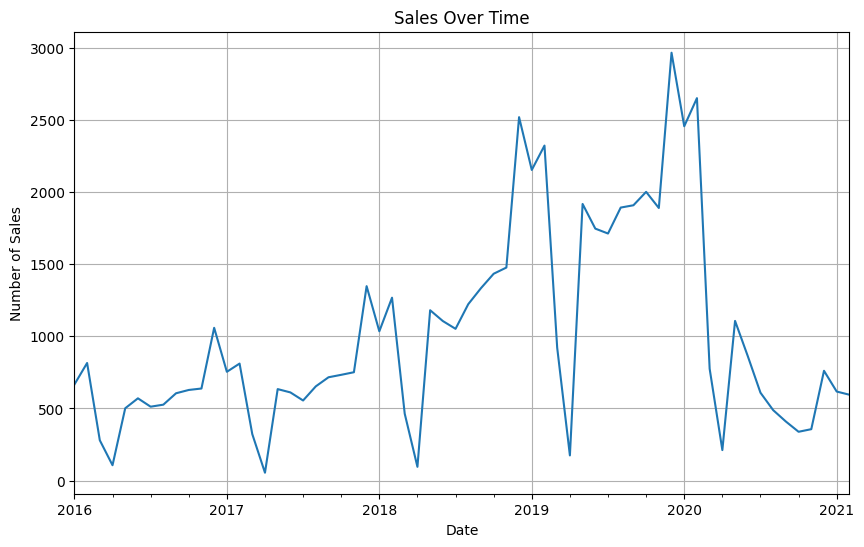

Visualizations saved as 'product_price_distribution.png' and 'sales_over_time.png'.


In [65]:

# Visualization 1: Distribution of Product Prices
plt.figure(figsize=(10, 6))
sns.histplot(products['Unit Price USD'], bins=30, kde=True)
plt.title('Distribution of Product Prices')
plt.xlabel('Price (USD)')
plt.ylabel('Frequency')
plt.grid()
plt.savefig('product_price_distribution.png')
plt.close()

# Visualization 2: Sales Over Time
sales['Order Date'] = pd.to_datetime(sales['Order Date'])
sales_over_time = sales.groupby(sales['Order Date'].dt.to_period('M')).size() 

"""

This line groups the sales data by month.
The sales['Order Date'].dt.to_period('M') part converts the datetime objects to a period representation that represents months. 
This means that all dates within the same month will be grouped together.
The groupby() function is used to group the DataFrame by the specified period (in this case, by month).
The size() function counts the number of entries (or orders) in each group (i.e., each month) and returns a Series with the count of orders for each month.
Summary
The first line ensures that the 'Order Date' is in a format that can be easily manipulated as dates.
The second line aggregates the sales data by month, counting how many orders were placed in each month.

"""

plt.figure(figsize=(10, 6))
sales_over_time.plot(kind='line')
plt.title('Sales Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Sales')
plt.grid()
plt.show()
plt.savefig('sales_over_time.png')
plt.close()

print("Visualizations saved as 'product_price_distribution.png' and 'sales_over_time.png'.")


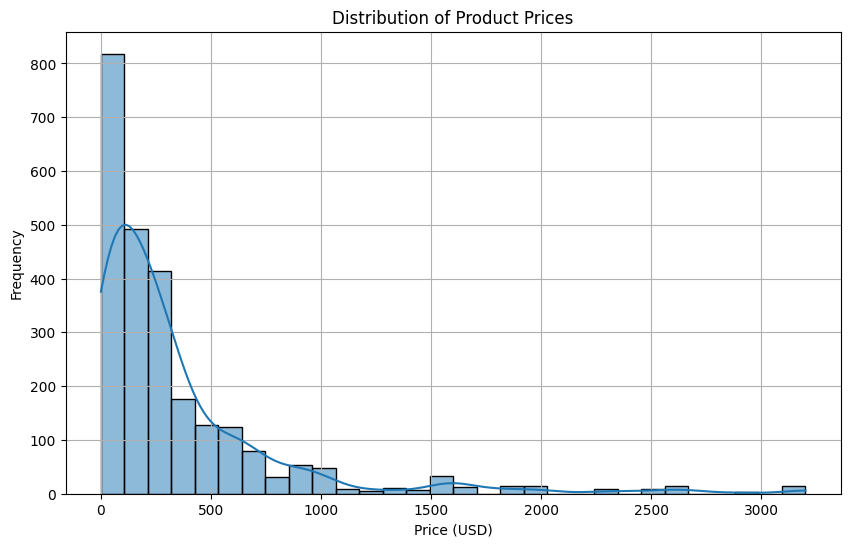

In [66]:
plt.figure(figsize=(10, 6))
sns.histplot(products['Unit Price USD'], bins=30, kde=True)
plt.title('Distribution of Product Prices')
plt.xlabel('Price (USD)')
plt.ylabel('Frequency')
plt.grid()

plt.show()

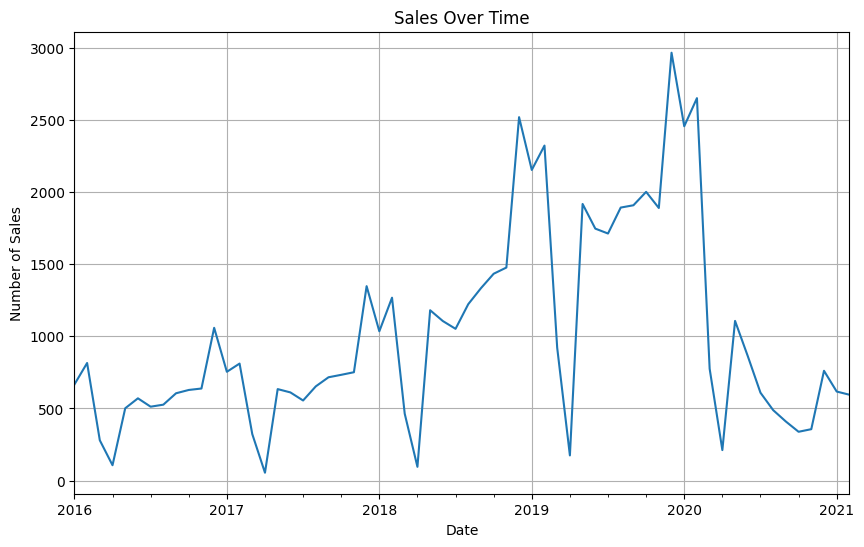

In [67]:
sales['Order Date'] = pd.to_datetime(sales['Order Date'])
sales_over_time = sales.groupby(sales['Order Date'].dt.to_period('M')).size() 
plt.figure(figsize=(10, 6))
sales_over_time.plot(kind='line')
plt.title('Sales Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Sales')
plt.grid()
plt.show()

Combine Datasets for Few insights

In [68]:
merged_data = sales.merge(customer, on='CustomerKey', how='left') \
                    .merge(products, on='ProductKey', how='left') \
                    .merge(Stores, on='StoreKey', how='left')

In [69]:
merged_data

,Order Number,Line Item,Order Date,CustomerKey,StoreKey,ProductKey,Quantity,Currency Code,Gender,Name,...,Unit Cost USD,Unit Price USD,SubcategoryKey,Subcategory,CategoryKey,Category,Country_y,State_y,Square Meters,Open Date
0,366000,1,2016-01-01,265598,10,1304,1,CAD,Male,Tyler Vaught,...,31.27,68.00,406,Cameras & Camcorders Accessories,4,Cameras and camcorders,Canada,Nunavut,1210.0,2015-04-04
1,366001,1,2016-01-01,1269051,0,1048,2,USD,Male,Frank Upchurch,...,141.47,427.00,402,Digital SLR Cameras,4,Cameras and camcorders,NaN,NaN,NaN,NaT
2,366001,2,2016-01-01,1269051,0,2007,1,USD,Male,Frank Upchurch,...,220.64,665.94,803,Microwaves,8,Home Appliances,NaN,NaN,NaN,NaT
3,366002,1,2016-01-01,266019,0,1106,7,CAD,Female,Joan Roche,...,148.08,322.00,402,Digital SLR Cameras,4,Cameras and camcorders,NaN,NaN,NaN,NaT
4,366002,2,2016-01-01,266019,0,373,1,CAD,Female,Joan Roche,...,166.20,326.00,301,Laptops,3,Computers,NaN,NaN,NaN,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62879,2243030,1,2021-02-20,1216913,43,632,3,USD,Male,Donald Woodie,...,70.87,139.00,305,Projectors & Screens,3,Computers,United States,Alaska,1190.0,2015-01-01
62880,2243031,1,2021-02-20,511229,0,98,4,EUR,Female,Gabriele Thalberg,...,55.18,120.00,106,Bluetooth Headphones,1,Audio,NaN,NaN,NaN,NaT
62881,2243032,1,2021-02-20,331277,0,1613,2,CAD,Male,William Rochelle,...,56.08,109.99,602,Movie DVD,6,"Music, Movies and Audio Books",NaN,NaN,NaN,NaT
62882,2243032,2,2021-02-20,331277,0,1717,2,CAD,Male,William Rochelle,...,32.25,70.13,702,Download Games,7,Games and Toys,NaN,NaN,NaN,NaT


In [221]:
merged_data.to_csv("new datasets/overalldata.csv", index= False)

In [70]:
# Calculate average quantity sold by gender
avg_quantity_by_gender = merged_data.groupby('Gender')['Quantity'].mean()
avg_quantity_by_gender.astype(int)

Gender
Female    3
Male      3
Name: Quantity, dtype: int64

In [71]:
# Perform a T-test between two genders
male_sales = merged_data[merged_data['Gender'] == 'Male']['Quantity']
female_sales = merged_data[merged_data['Gender'] == 'Female']['Quantity']
t_stat, p_value = stats.ttest_ind(male_sales, female_sales, nan_policy='omit')
t_stat, p_value

(np.float64(0.16290805678098436), np.float64(0.8705913506705056))

In [72]:
# Prepare insights
insights = {
    'avg_quantity_by_gender': avg_quantity_by_gender.to_dict(),
    't_statistic': t_stat,
    'p_value': p_value
}

# Display insights
print("Statistical Insights:")
insights

Statistical Insights:


{'avg_quantity_by_gender': {'Female': 3.1433075933075934,
  'Male': 3.146239466733744},
 't_statistic': np.float64(0.16290805678098436),
 'p_value': np.float64(0.8705913506705056)}

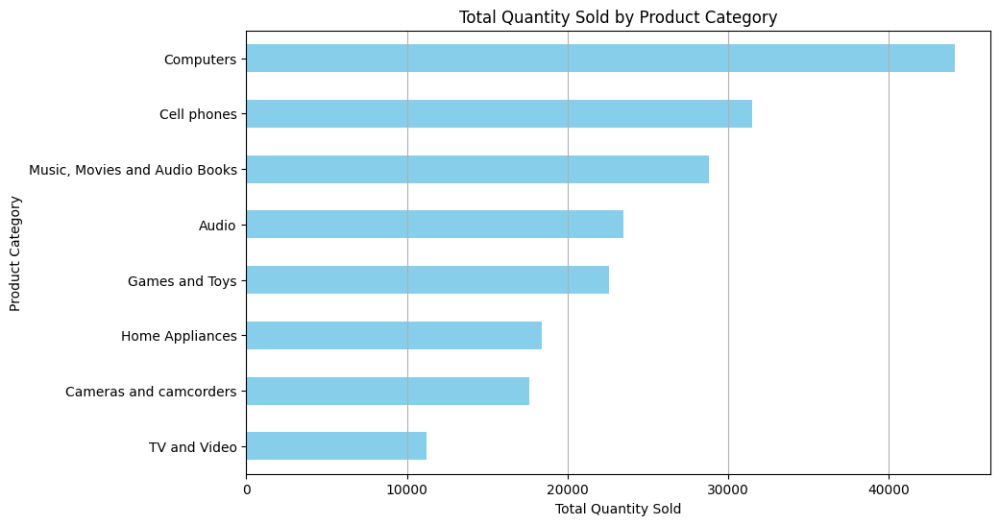

In [73]:
# Plot 1: Total Quantity Sold by Product Category
plt.figure(figsize=(10, 6))
category_sales = merged_data.groupby('Category')['Quantity'].sum().sort_values()
category_sales.plot(kind='barh', color='skyblue')
plt.title('Total Quantity Sold by Product Category')
plt.xlabel('Total Quantity Sold')
plt.ylabel('Product Category')
plt.grid(axis='x')
plt.show()

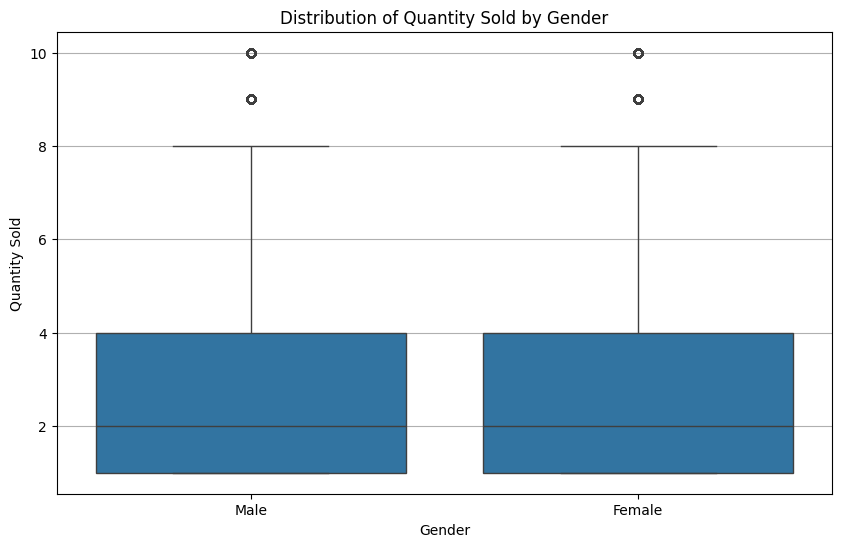

In [74]:
# Plot 2: Box Plot of Quantity Sold by Gender
plt.figure(figsize=(10, 6))
sns.boxplot(x='Gender', y='Quantity', data=merged_data)
plt.title('Distribution of Quantity Sold by Gender')
plt.xlabel('Gender')
plt.ylabel('Quantity Sold')
plt.grid(axis='y')
plt.show()


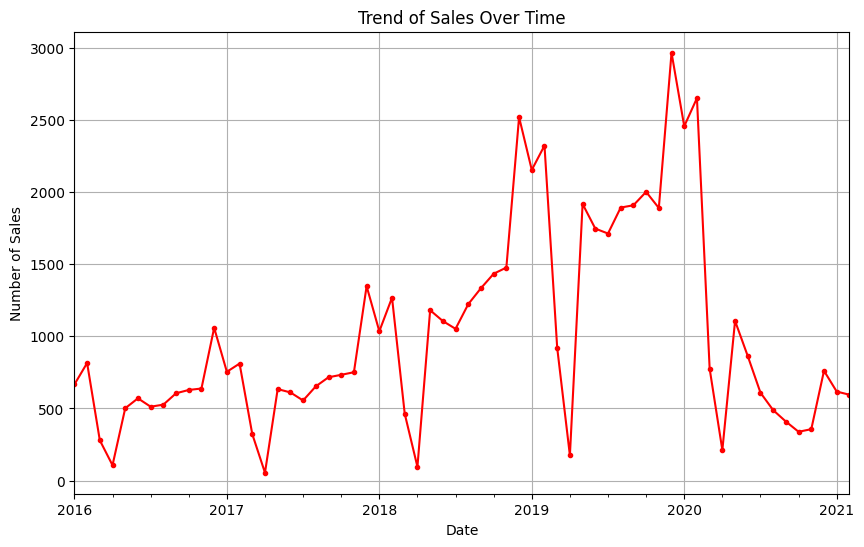

In [75]:

# Plot 3: Trend of Sales Over Time
merged_data['Order Date'] = pd.to_datetime(merged_data['Order Date'])
sales_over_time = merged_data.groupby(merged_data['Order Date'].dt.to_period('M')).size()

plt.figure(figsize=(10, 6))
sales_over_time.plot(kind='line', marker='.', color='red')
plt.title('Trend of Sales Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Sales')
plt.grid()
plt.show()

In [11]:
import pandas as pd

In [12]:
newcus=pd.read_csv("new datasets/customer.csv")
newprod=pd.read_csv("new datasets/products.csv")
newsales=pd.read_csv("new datasets/sales.csv")
newstore=pd.read_csv("new datasets/stores.csv")
newrates=pd.read_csv("new datasets/exchange_rate.csv")

In [13]:
newcus

,CustomerKey,Gender,Name,City,State Code,State,Zip Code,Country,Continent,Birthday
0,301,Female,Lilly Harding,WANDEARAH EAST,SA,South Australia,5523,Australia,Australia,1939-07-03
1,325,Female,Madison Hull,MOUNT BUDD,WA,Western Australia,6522,Australia,Australia,1979-09-27
2,554,Female,Claire Ferres,WINJALLOK,VIC,Victoria,3380,Australia,Australia,1947-05-26
3,786,Male,Jai Poltpalingada,MIDDLE RIVER,SA,South Australia,5223,Australia,Australia,1957-09-17
4,1042,Male,Aidan Pankhurst,TAWONGA SOUTH,VIC,Victoria,3698,Australia,Australia,1965-11-19
...,...,...,...,...,...,...,...,...,...,...
15261,2099600,Female,Denisa Duková,Houston,TX,Texas,77017,United States,North America,1936-03-25
15262,2099618,Male,Justin Solórzano,Mclean,VA,Virginia,22101,United States,North America,1992-02-16
15263,2099758,Male,Svend Petrussen,Wilmington,NC,North Carolina,28405,United States,North America,1937-11-09
15264,2099862,Female,Lorenza Rush,Riverside,CA,California,92501,United States,North America,1937-10-12


In [14]:
customers_sales_merged=pd.merge(newcus,newsales,on='CustomerKey')
customers_sales_merged

,CustomerKey,Gender,Name,City,State Code,State,Zip Code,Country,Continent,Birthday,Order Number,Line Item,Order Date,StoreKey,ProductKey,Quantity,Currency Code
0,301,Female,Lilly Harding,WANDEARAH EAST,SA,South Australia,5523,Australia,Australia,1939-07-03,1776007,1,2019-11-11,0,53,2,AUD
1,325,Female,Madison Hull,MOUNT BUDD,WA,Western Australia,6522,Australia,Australia,1979-09-27,1109001,1,2018-01-13,6,443,4,AUD
2,325,Female,Madison Hull,MOUNT BUDD,WA,Western Australia,6522,Australia,Australia,1979-09-27,1109001,2,2018-01-13,6,656,4,AUD
3,325,Female,Madison Hull,MOUNT BUDD,WA,Western Australia,6522,Australia,Australia,1979-09-27,1109001,3,2018-01-13,6,1084,3,AUD
4,325,Female,Madison Hull,MOUNT BUDD,WA,Western Australia,6522,Australia,Australia,1979-09-27,1781006,1,2019-11-16,6,418,3,AUD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62879,2099937,Male,Zygmunt Kaminski,Bloomfield Township,MI,Michigan,48302,United States,North America,1965-08-18,1269016,2,2018-06-22,56,425,5,USD
62880,2099937,Male,Zygmunt Kaminski,Bloomfield Township,MI,Michigan,48302,United States,North America,1965-08-18,1269016,3,2018-06-22,56,344,7,USD
62881,2099937,Male,Zygmunt Kaminski,Bloomfield Township,MI,Michigan,48302,United States,North America,1965-08-18,1269016,4,2018-06-22,56,1162,1,USD
62882,2099937,Male,Zygmunt Kaminski,Bloomfield Township,MI,Michigan,48302,United States,North America,1965-08-18,1872055,1,2020-02-15,53,434,10,USD


In [15]:
customers_sales_merged.isnull().sum()

CustomerKey      0
Gender           0
Name             0
City             0
State Code       0
State            0
Zip Code         0
Country          0
Continent        0
Birthday         0
Order Number     0
Line Item        0
Order Date       0
StoreKey         0
ProductKey       0
Quantity         0
Currency Code    0
dtype: int64

In [234]:
customers_sales_merged.to_csv("new datasets/customer_sales.csv")

In [16]:
products_sales_merged=pd.merge(newprod,newsales,on='ProductKey')
products_sales_merged.head()

,ProductKey,Product Name,Brand,Color,Unit Cost USD,Unit Price USD,SubcategoryKey,Subcategory,CategoryKey,Category,Order Number,Line Item,Order Date,CustomerKey,StoreKey,Quantity,Currency Code
0,1,Contoso 512MB MP3 Player E51 Silver,Contoso,Silver,6.62,12.99,101,MP4&MP3,1,Audio,493001,3,2016-05-07,453993,0,1,EUR
1,1,Contoso 512MB MP3 Player E51 Silver,Contoso,Silver,6.62,12.99,101,MP4&MP3,1,Audio,728016,1,2016-12-28,1513119,47,1,USD
2,1,Contoso 512MB MP3 Player E51 Silver,Contoso,Silver,6.62,12.99,101,MP4&MP3,1,Audio,891001,1,2017-06-09,741381,0,1,EUR
3,1,Contoso 512MB MP3 Player E51 Silver,Contoso,Silver,6.62,12.99,101,MP4&MP3,1,Audio,1025004,4,2017-10-21,2028962,56,8,USD
4,1,Contoso 512MB MP3 Player E51 Silver,Contoso,Silver,6.62,12.99,101,MP4&MP3,1,Audio,1053003,3,2017-11-18,1579183,50,3,USD


In [236]:
products_sales_merged.to_csv("new datasets/product_sales.csv")

In [17]:
store_sales_merged=pd.merge(newstore,newsales,on='StoreKey')
store_sales_merged.head()

,StoreKey,Country,State,Square Meters,Open Date,Order Number,Line Item,Order Date,CustomerKey,ProductKey,Quantity,Currency Code
0,1,Australia,Australian Capital Territory,595.0,2008-01-01,518002,1,2016-06-01,126573,284,2,AUD
1,1,Australia,Australian Capital Territory,595.0,2008-01-01,518002,2,2016-06-01,126573,548,3,AUD
2,1,Australia,Australian Capital Territory,595.0,2008-01-01,518002,3,2016-06-01,126573,31,1,AUD
3,1,Australia,Australian Capital Territory,595.0,2008-01-01,531006,1,2016-06-14,35257,775,3,AUD
4,1,Australia,Australian Capital Territory,595.0,2008-01-01,584001,1,2016-08-06,137865,2090,1,AUD


In [238]:
store_sales_merged.to_csv("new datasets/store_sales.csv")

In [18]:
import pandas as pd

In [86]:
pip install mysql.connector

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.9/11.9 MB 6.4 MB/s eta 0:00:0000:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for mysql.connector: filename=mysql_connector-2.2.9-cp313-cp313-macosx_10_13_universal2.whl size=247972 sha256=d460080432055cac68e83865a8c3c738d45bb23a2f9190654f2da874ce6129a8
  Stored in directory: /Users/rishiraja/Library/Caches/pip/wheels/4e/c1/23/9423c444a75266a05275c80ebf5c6efe2368388e976b690a0f
Successfully built mysql.connector

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip3.13 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [4]:
import mysql.connector

In [9]:
mydb=mysql.connector.connect(
            host="localhost",
            user="root",
            password="R!sh!raj00ty",
            database="spark",
)


cursor = mydb.cursor()

In [19]:
newcus.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15266 entries, 0 to 15265
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   CustomerKey  15266 non-null  int64 
 1   Gender       15266 non-null  object
 2   Name         15266 non-null  object
 3   City         15266 non-null  object
 4   State Code   15266 non-null  object
 5   State        15266 non-null  object
 6   Zip Code     15266 non-null  object
 7   Country      15266 non-null  object
 8   Continent    15266 non-null  object
 9   Birthday     15266 non-null  object
dtypes: int64(1), object(9)
memory usage: 1.2+ MB


In [22]:
pip install tabulate


  Using cached tabulate-0.9.0-py3-none-any.whl.metadata (34 kB)
Using cached tabulate-0.9.0-py3-none-any.whl (35 kB)

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip3.13 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [23]:
cursor.execute("SHOW TABLES")
out = cursor.fetchall()
from tabulate import tabulate
print(tabulate(out,headers=[i[0] for i in cursor.description]))

Tables_in_spark
-----------------


In [24]:
#create table customer details
create_table_query="""create table customerdetails(CustomerKey int,
                                        Gender varchar(200),
                                        Name varchar(200),
                                        City varchar(200),
                                        StateCode varchar(100),
                                        State varchar(200),
                                        ZipCode varchar(100),
                                        Country varchar(200),
                                        Continent varchar(200),
                                        Birthday date
                                        )"""
cursor.execute(create_table_query)


In [25]:
datas = newcus.values.tolist()

In [26]:
datas

[[301,
  'Female',
  'Lilly Harding',
  'WANDEARAH EAST',
  'SA',
  'South Australia',
  '5523',
  'Australia',
  'Australia',
  '1939-07-03'],
 [325,
  'Female',
  'Madison Hull',
  'MOUNT BUDD',
  'WA',
  'Western Australia',
  '6522',
  'Australia',
  'Australia',
  '1979-09-27'],
 [554,
  'Female',
  'Claire Ferres',
  'WINJALLOK',
  'VIC',
  'Victoria',
  '3380',
  'Australia',
  'Australia',
  '1947-05-26'],
 [786,
  'Male',
  'Jai Poltpalingada',
  'MIDDLE RIVER',
  'SA',
  'South Australia',
  '5223',
  'Australia',
  'Australia',
  '1957-09-17'],
 [1042,
  'Male',
  'Aidan Pankhurst',
  'TAWONGA SOUTH',
  'VIC',
  'Victoria',
  '3698',
  'Australia',
  'Australia',
  '1965-11-19'],
 [1086,
  'Male',
  'Hayden Clegg',
  'TEMPLERS',
  'SA',
  'South Australia',
  '5371',
  'Australia',
  'Australia',
  '1954-01-20'],
 [1133,
  'Male',
  'Nicholas Caffyn',
  'JUBILEE POCKET',
  'QLD',
  'Queensland',
  '4802',
  'Australia',
  'Australia',
  '1969-11-22'],
 [1256,
  'Male',
  'Li

In [27]:
data="""INSERT INTO customerdetails(CustomerKey, Gender, Name, City, StateCode,
                                    State, ZipCode, Country, Continent, Birthday) 
                                        VALUES (%s,%s,%s,%s,%s,%s,%s,%s,%s,%s)"""

cursor.executemany(data, datas)
mydb.commit()


In [28]:
cursor.execute("SELECT * FROM customerdetails")
out = cursor.fetchall()
from tabulate import tabulate
print(tabulate(out,headers=[i[0] for i in cursor.description]))

  CustomerKey  Gender    Name                         City                                  StateCode                     State                         ZipCode    Country         Continent      Birthday
-------------  --------  ---------------------------  ------------------------------------  ----------------------------  ----------------------------  ---------  --------------  -------------  ----------
          301  Female    Lilly Harding                WANDEARAH EAST                        SA                            South Australia               5523       Australia       Australia      1939-07-03
          325  Female    Madison Hull                 MOUNT BUDD                            WA                            Western Australia             6522       Australia       Australia      1979-09-27
          554  Female    Claire Ferres                WINJALLOK                             VIC                           Victoria                      3380       Australia       Aus

In [29]:
#create table exchange rates 
create_table_query="""create table exchangerates(Date date,Currency varchar(200),Exchange float)"""
cursor.execute(create_table_query)


In [30]:
datas_newrates = newrates.values.tolist()

In [31]:
datas_newrates

[['2015-01-01', 'USD', 1.0],
 ['2015-01-01', 'CAD', 1.1583],
 ['2015-01-01', 'AUD', 1.2214],
 ['2015-01-01', 'EUR', 0.8237],
 ['2015-01-01', 'GBP', 0.6415],
 ['2015-01-02', 'USD', 1.0],
 ['2015-01-02', 'CAD', 1.1682],
 ['2015-01-02', 'AUD', 1.2323],
 ['2015-01-02', 'EUR', 0.8304],
 ['2015-01-02', 'GBP', 0.6477],
 ['2015-01-03', 'USD', 1.0],
 ['2015-01-03', 'CAD', 1.1682],
 ['2015-01-03', 'AUD', 1.2323],
 ['2015-01-03', 'EUR', 0.8304],
 ['2015-01-03', 'GBP', 0.6477],
 ['2015-01-04', 'USD', 1.0],
 ['2015-01-04', 'CAD', 1.1682],
 ['2015-01-04', 'AUD', 1.2323],
 ['2015-01-04', 'EUR', 0.8304],
 ['2015-01-04', 'GBP', 0.6477],
 ['2015-01-05', 'USD', 1.0],
 ['2015-01-05', 'CAD', 1.1784],
 ['2015-01-05', 'AUD', 1.2384],
 ['2015-01-05', 'EUR', 0.8393],
 ['2015-01-05', 'GBP', 0.6569],
 ['2015-01-06', 'USD', 1.0],
 ['2015-01-06', 'CAD', 1.1763],
 ['2015-01-06', 'AUD', 1.2288],
 ['2015-01-06', 'EUR', 0.8393],
 ['2015-01-06', 'GBP', 0.6582],
 ['2015-01-07', 'USD', 1.0],
 ['2015-01-07', 'CAD', 1.183]

In [32]:
data="""INSERT INTO exchangerates(Date, Currency, Exchange) 
                                        VALUES (%s,%s,%s)"""

cursor.executemany(data, datas_newrates)
mydb.commit()
                 

In [33]:
cursor.execute("SELECT * FROM exchangerates")
out = cursor.fetchall()
from tabulate import tabulate
print(tabulate(out,headers=[i[0] for i in cursor.description]))

Date        Currency      Exchange
----------  ----------  ----------
2015-01-01  USD             1
2015-01-01  CAD             1.1583
2015-01-01  AUD             1.2214
2015-01-01  EUR             0.8237
2015-01-01  GBP             0.6415
2015-01-02  USD             1
2015-01-02  CAD             1.1682
2015-01-02  AUD             1.2323
2015-01-02  EUR             0.8304
2015-01-02  GBP             0.6477
2015-01-03  USD             1
2015-01-03  CAD             1.1682
2015-01-03  AUD             1.2323
2015-01-03  EUR             0.8304
2015-01-03  GBP             0.6477
2015-01-04  USD             1
2015-01-04  CAD             1.1682
2015-01-04  AUD             1.2323
2015-01-04  EUR             0.8304
2015-01-04  GBP             0.6477
2015-01-05  USD             1
2015-01-05  CAD             1.1784
2015-01-05  AUD             1.2384
2015-01-05  EUR             0.8393
2015-01-05  GBP             0.6569
2015-01-06  USD             1
2015-01-06  CAD             1.1763
2015-01-06  AUD

In [34]:
create_table_query="""create table productdetails(ProductKey int,
                                        Product_Name varchar(200),
                                        Brand varchar(200),
                                        Color varchar(200),
                                        Unit_Cost_USD float,
                                        Unit_Price_USD float,
                                        SubcategoryKey int,
                                        Subcategory varchar(200),
                                        CategoryKey int,
                                        Category varchar(250)
                                        )"""
cursor.execute(create_table_query)

                                         

In [35]:
datas_newprod = newprod.values.tolist()

In [36]:
datas_newprod

[[1,
  'Contoso 512MB MP3 Player E51 Silver',
  'Contoso',
  'Silver',
  6.62,
  12.99,
  101,
  'MP4&MP3',
  1,
  'Audio'],
 [2,
  'Contoso 512MB MP3 Player E51 Blue',
  'Contoso',
  'Blue',
  6.62,
  12.99,
  101,
  'MP4&MP3',
  1,
  'Audio'],
 [3,
  'Contoso 1G MP3 Player E100 White',
  'Contoso',
  'White',
  7.4,
  14.52,
  101,
  'MP4&MP3',
  1,
  'Audio'],
 [4,
  'Contoso 2G MP3 Player E200 Silver',
  'Contoso',
  'Silver',
  11.0,
  21.57,
  101,
  'MP4&MP3',
  1,
  'Audio'],
 [5,
  'Contoso 2G MP3 Player E200 Red',
  'Contoso',
  'Red',
  11.0,
  21.57,
  101,
  'MP4&MP3',
  1,
  'Audio'],
 [6,
  'Contoso 2G MP3 Player E200 Black',
  'Contoso',
  'Black',
  11.0,
  21.57,
  101,
  'MP4&MP3',
  1,
  'Audio'],
 [7,
  'Contoso 2G MP3 Player E200 Blue',
  'Contoso',
  'Blue',
  11.0,
  21.57,
  101,
  'MP4&MP3',
  1,
  'Audio'],
 [8,
  'Contoso 4G MP3 Player E400 Silver',
  'Contoso',
  'Silver',
  30.58,
  59.99,
  101,
  'MP4&MP3',
  1,
  'Audio'],
 [9,
  'Contoso 4G MP3 Player 

In [37]:
data="""INSERT INTO productdetails(ProductKey, Product_Name, Brand, Color, Unit_Cost_USD, Unit_Price_USD, SubcategoryKey, Subcategory, CategoryKey, Category) 
                                        VALUES (%s,%s,%s,%s,%s,%s,%s,%s,%s,%s)"""

cursor.executemany(data, datas_newprod)
mydb.commit()

In [38]:
cursor.execute("SELECT * FROM productdetails")
out = cursor.fetchall()
from tabulate import tabulate
print(tabulate(out,headers=[i[0] for i in cursor.description]))

  ProductKey  Product_Name                                                                         Brand                 Color          Unit_Cost_USD    Unit_Price_USD    SubcategoryKey  Subcategory                         CategoryKey  Category
------------  -----------------------------------------------------------------------------------  --------------------  -----------  ---------------  ----------------  ----------------  --------------------------------  -------------  -----------------------------
           1  Contoso 512MB MP3 Player E51 Silver                                                  Contoso               Silver                  6.62             12.99               101  MP4&MP3                                       1  Audio
           2  Contoso 512MB MP3 Player E51 Blue                                                    Contoso               Blue                    6.62             12.99               101  MP4&MP3                                       1  Audio
     

In [39]:
create_table_query="""create table salesdetails(Order_Number int,
                                        Line_Item int,
                                        Order_Date date,
                                        CustomerKey int,
                                        StoreKey int,
                                        ProductKey int,
                                        Quantity int,
                                        Currency_Code varchar(100)
                                        )"""
cursor.execute(create_table_query)

In [40]:
datas_newsales = newsales.values.tolist()

In [41]:
datas_newsales

[[366000, 1, '2016-01-01', 265598, 10, 1304, 1, 'CAD'],
 [366001, 1, '2016-01-01', 1269051, 0, 1048, 2, 'USD'],
 [366001, 2, '2016-01-01', 1269051, 0, 2007, 1, 'USD'],
 [366002, 1, '2016-01-01', 266019, 0, 1106, 7, 'CAD'],
 [366002, 2, '2016-01-01', 266019, 0, 373, 1, 'CAD'],
 [366002, 3, '2016-01-01', 266019, 0, 1080, 4, 'CAD'],
 [366004, 1, '2016-01-01', 1107461, 38, 163, 6, 'GBP'],
 [366004, 2, '2016-01-01', 1107461, 38, 1529, 2, 'GBP'],
 [366005, 1, '2016-01-01', 844003, 33, 421, 4, 'EUR'],
 [366007, 1, '2016-01-01', 2035771, 43, 1617, 1, 'USD'],
 [366007, 2, '2016-01-01', 2035771, 43, 666, 5, 'USD'],
 [366008, 1, '2016-01-01', 759705, 29, 1154, 9, 'EUR'],
 [366008, 2, '2016-01-01', 759705, 29, 2510, 1, 'EUR'],
 [366008, 3, '2016-01-01', 759705, 29, 1060, 5, 'EUR'],
 [366009, 1, '2016-01-01', 254540, 9, 1648, 1, 'CAD'],
 [366010, 1, '2016-01-01', 370077, 0, 618, 5, 'CAD'],
 [366011, 1, '2016-01-01', 1984985, 66, 128, 7, 'USD'],
 [366011, 2, '2016-01-01', 1984985, 66, 1638, 1, 'USD'

In [42]:

data="""INSERT INTO salesdetails(Order_Number, Line_Item, Order_Date, CustomerKey, StoreKey, ProductKey, Quantity, Currency_Code) 
                                        VALUES (%s,%s,%s,%s,%s,%s,%s,%s)"""

cursor.executemany(data,datas_newsales)
mydb.commit()

In [43]:
cursor.execute("SELECT * FROM salesdetails")
out = cursor.fetchall()
from tabulate import tabulate
print(tabulate(out,headers=[i[0] for i in cursor.description]))

  Order_Number    Line_Item  Order_Date      CustomerKey    StoreKey    ProductKey    Quantity  Currency_Code
--------------  -----------  ------------  -------------  ----------  ------------  ----------  ---------------
        366000            1  2016-01-01           265598          10          1304           1  CAD
        366001            1  2016-01-01          1269051           0          1048           2  USD
        366001            2  2016-01-01          1269051           0          2007           1  USD
        366002            1  2016-01-01           266019           0          1106           7  CAD
        366002            2  2016-01-01           266019           0           373           1  CAD
        366002            3  2016-01-01           266019           0          1080           4  CAD
        366004            1  2016-01-01          1107461          38           163           6  GBP
        366004            2  2016-01-01          1107461          38          

In [44]:
datas_newstore = newstore.values.tolist()

In [45]:
datas_newstore

[[1, 'Australia', 'Australian Capital Territory', 595.0, '2008-01-01'],
 [2, 'Australia', 'Northern Territory', 665.0, '2008-01-12'],
 [3, 'Australia', 'South Australia', 2000.0, '2012-01-07'],
 [4, 'Australia', 'Tasmania', 2000.0, '2010-01-01'],
 [5, 'Australia', 'Victoria', 2000.0, '2015-12-09'],
 [6, 'Australia', 'Western Australia', 2000.0, '2010-01-01'],
 [7, 'Canada', 'New Brunswick', 1105.0, '2007-05-07'],
 [8, 'Canada', 'Newfoundland and Labrador', 2105.0, '2014-07-02'],
 [9, 'Canada', 'Northwest Territories', 1500.0, '2005-03-04'],
 [10, 'Canada', 'Nunavut', 1210.0, '2015-04-04'],
 [11, 'Canada', 'Yukon', 1210.0, '2009-06-03'],
 [12, 'France', 'Basse-Normandie', 350.0, '2012-06-06'],
 [13, 'France', 'Corse', 245.0, '2013-06-07'],
 [14, 'France', 'Franche-Comté', 350.0, '2009-12-15'],
 [15, 'France', 'La Réunion', 400.0, '2015-01-01'],
 [16, 'France', 'Limousin', 385.0, '2010-06-03'],
 [17, 'France', 'Martinique', 350.0, '2007-07-08'],
 [18, 'France', 'Mayotte', 310.0, '2012-08

In [46]:
create_table_query="""create table storesdetails(StoreKey int,
                                        Country varchar(250),
                                        State varchar(250),
                                        Square_Meters int,
                                        Open_Date date
                                        )"""
cursor.execute(create_table_query)
data="""INSERT INTO storesdetails(StoreKey, Country, State, Square_Meters, Open_Date) 
                                        VALUES (%s,%s,%s,%s,%s)"""

cursor.executemany(data, datas_newstore)
mydb.commit()

In [47]:
cursor.execute("SELECT * FROM storesdetails")
out = cursor.fetchall()
from tabulate import tabulate
print(tabulate(out,headers=[i[0] for i in cursor.description]))

  StoreKey  Country         State                           Square_Meters  Open_Date
----------  --------------  ----------------------------  ---------------  -----------
         1  Australia       Australian Capital Territory              595  2008-01-01
         2  Australia       Northern Territory                        665  2008-01-12
         3  Australia       South Australia                          2000  2012-01-07
         4  Australia       Tasmania                                 2000  2010-01-01
         5  Australia       Victoria                                 2000  2015-12-09
         6  Australia       Western Australia                        2000  2010-01-01
         7  Canada          New Brunswick                            1105  2007-05-07
         8  Canada          Newfoundland and Labrador                2105  2014-07-02
         9  Canada          Northwest Territories                    1500  2005-03-04
        10  Canada          Nunavut                   

In [48]:
#create table customer_sales_merged
create_table_query="""create table customers_sales_merged(CustomerKey int,
                                        Gender varchar(200),
                                        Name varchar(200),
                                        City varchar(200),
                                        StateCode varchar(100),
                                        State varchar(200),
                                        ZipCode varchar(100),
                                        Country varchar(200),
                                        Continent varchar(200),
                                        Birthday date,
                                        Order_Number int,
                                        Line_Item int,
                                        Order_Date date,
                                        StoreKey int,
                                        ProductKey int,
                                        Quantity int,
                                        Currency_Code varchar(100)
                                        )"""
cursor.execute(create_table_query)

In [49]:
datas_customers_sales_merged = customers_sales_merged.values.tolist()

In [50]:
datas_customers_sales_merged

[[301,
  'Female',
  'Lilly Harding',
  'WANDEARAH EAST',
  'SA',
  'South Australia',
  '5523',
  'Australia',
  'Australia',
  '1939-07-03',
  1776007,
  1,
  '2019-11-11',
  0,
  53,
  2,
  'AUD'],
 [325,
  'Female',
  'Madison Hull',
  'MOUNT BUDD',
  'WA',
  'Western Australia',
  '6522',
  'Australia',
  'Australia',
  '1979-09-27',
  1109001,
  1,
  '2018-01-13',
  6,
  443,
  4,
  'AUD'],
 [325,
  'Female',
  'Madison Hull',
  'MOUNT BUDD',
  'WA',
  'Western Australia',
  '6522',
  'Australia',
  'Australia',
  '1979-09-27',
  1109001,
  2,
  '2018-01-13',
  6,
  656,
  4,
  'AUD'],
 [325,
  'Female',
  'Madison Hull',
  'MOUNT BUDD',
  'WA',
  'Western Australia',
  '6522',
  'Australia',
  'Australia',
  '1979-09-27',
  1109001,
  3,
  '2018-01-13',
  6,
  1084,
  3,
  'AUD'],
 [325,
  'Female',
  'Madison Hull',
  'MOUNT BUDD',
  'WA',
  'Western Australia',
  '6522',
  'Australia',
  'Australia',
  '1979-09-27',
  1781006,
  1,
  '2019-11-16',
  6,
  418,
  3,
  'AUD'],
 [

In [51]:
data="""INSERT INTO customers_sales_merged(CustomerKey, Gender, Name, City, StateCode, State, ZipCode, Country, Continent,                                       Birthday,Order_Number, Line_Item, Order_Date,StoreKey, ProductKey, Quantity, Currency_Code) 
                                        VALUES (%s,%s,%s,%s,%s,%s,%s,%s,%s,%s,%s,%s,%s,%s,%s,%s,%s)"""

cursor.executemany(data, datas_customers_sales_merged)
mydb.commit()

In [52]:
#create table products_sales_merged
create_table_query="""create table products_sales_merged(ProductKey int,
                                        Product_Name varchar(200),
                                        Brand varchar(200),
                                        Color varchar(200),
                                        Unit_Cost_USD float,
                                        Unit_Price_USD float,
                                        SubcategoryKey int,
                                        Subcategory varchar(200),
                                        CategoryKey int,
                                        Category varchar(250),
                                        Order_Number int,
                                        Line_Item int,
                                        Order_Date date,
                                        CustomerKey int,
                                        StoreKey int,
                                        Quantity int,
                                        Currency_Code varchar(100)
                                        )"""
cursor.execute(create_table_query)

In [53]:
datas_products_sales_merged = products_sales_merged.values.tolist()

In [54]:
datas_products_sales_merged

[[1,
  'Contoso 512MB MP3 Player E51 Silver',
  'Contoso',
  'Silver',
  6.62,
  12.99,
  101,
  'MP4&MP3',
  1,
  'Audio',
  493001,
  3,
  '2016-05-07',
  453993,
  0,
  1,
  'EUR'],
 [1,
  'Contoso 512MB MP3 Player E51 Silver',
  'Contoso',
  'Silver',
  6.62,
  12.99,
  101,
  'MP4&MP3',
  1,
  'Audio',
  728016,
  1,
  '2016-12-28',
  1513119,
  47,
  1,
  'USD'],
 [1,
  'Contoso 512MB MP3 Player E51 Silver',
  'Contoso',
  'Silver',
  6.62,
  12.99,
  101,
  'MP4&MP3',
  1,
  'Audio',
  891001,
  1,
  '2017-06-09',
  741381,
  0,
  1,
  'EUR'],
 [1,
  'Contoso 512MB MP3 Player E51 Silver',
  'Contoso',
  'Silver',
  6.62,
  12.99,
  101,
  'MP4&MP3',
  1,
  'Audio',
  1025004,
  4,
  '2017-10-21',
  2028962,
  56,
  8,
  'USD'],
 [1,
  'Contoso 512MB MP3 Player E51 Silver',
  'Contoso',
  'Silver',
  6.62,
  12.99,
  101,
  'MP4&MP3',
  1,
  'Audio',
  1053003,
  3,
  '2017-11-18',
  1579183,
  50,
  3,
  'USD'],
 [1,
  'Contoso 512MB MP3 Player E51 Silver',
  'Contoso',
  'Silve

In [55]:
data="""INSERT INTO products_sales_merged(ProductKey, Product_Name, Brand, Color, Unit_Cost_USD, Unit_Price_USD, SubcategoryKey, Subcategory, CategoryKey, Category,
                                          Order_Number, Line_Item, Order_Date, CustomerKey, StoreKey, Quantity, Currency_Code) 
                                        VALUES (%s,%s,%s,%s,%s,%s,%s,%s,%s,%s,%s,%s,%s,%s,%s,%s,%s)"""

cursor.executemany(data, datas_products_sales_merged)
mydb.commit()

In [56]:
create_table_query="""create table store_sales_merged(StoreKey int,Country varchar(250),State varchar(250),Square_Meters int,
                                        Open_Date date,
                                        Order_Number int,
                                        Line_Item int,
                                        Order_Date date,
                                        CustomerKey int,
                                        ProductKey int,
                                        Quantity int,
                                        Currency_Code varchar(100)
                                        )"""
cursor.execute(create_table_query)

In [57]:
df_store_sales_merged = store_sales_merged.values.tolist()

In [58]:
df_store_sales_merged

[[1,
  'Australia',
  'Australian Capital Territory',
  595.0,
  '2008-01-01',
  518002,
  1,
  '2016-06-01',
  126573,
  284,
  2,
  'AUD'],
 [1,
  'Australia',
  'Australian Capital Territory',
  595.0,
  '2008-01-01',
  518002,
  2,
  '2016-06-01',
  126573,
  548,
  3,
  'AUD'],
 [1,
  'Australia',
  'Australian Capital Territory',
  595.0,
  '2008-01-01',
  518002,
  3,
  '2016-06-01',
  126573,
  31,
  1,
  'AUD'],
 [1,
  'Australia',
  'Australian Capital Territory',
  595.0,
  '2008-01-01',
  531006,
  1,
  '2016-06-14',
  35257,
  775,
  3,
  'AUD'],
 [1,
  'Australia',
  'Australian Capital Territory',
  595.0,
  '2008-01-01',
  584001,
  1,
  '2016-08-06',
  137865,
  2090,
  1,
  'AUD'],
 [1,
  'Australia',
  'Australian Capital Territory',
  595.0,
  '2008-01-01',
  596004,
  1,
  '2016-08-18',
  9812,
  917,
  1,
  'AUD'],
 [1,
  'Australia',
  'Australian Capital Territory',
  595.0,
  '2008-01-01',
  596004,
  2,
  '2016-08-18',
  9812,
  1579,
  5,
  'AUD'],
 [1,
  'Au

In [59]:
data="""INSERT INTO store_sales_merged(StoreKey, Country, State, Square_Meters, Open_Date,Order_Number, Line_Item, Order_Date, CustomerKey, ProductKey, Quantity, Currency_Code) 
                                        VALUES (%s,%s,%s,%s,%s,%s,%s,%s,%s,%s,%s,%s)"""

cursor.executemany(data, df_store_sales_merged)
mydb.commit()